In [65]:
!pip3 install ta

Defaulting to user installation because normal site-packages is not writeable
  Preparing metadata (setup.py) ... done
  Created wheel for ta: filename=ta-0.11.0-py3-none-any.whl size=29430 sha256=f96d7c84d8f9438ae942b267796033c0d594352f851f68907533df55903ecf1a
  Stored in directory: /Users/pratham28/Library/Caches/pip/wheels/61/d8/66/8018676d483fa5edb5337a7a25ee8c029ac255be25f90f3cd5
Successfully built ta

[notice] A new release of pip is available: 23.0.1 -> 24.1.2
[notice] To update, run: /Applications/Xcode.app/Contents/Developer/usr/bin/python3 -m pip install --upgrade pip


In [75]:
import os
import pandas as pd
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', None)


In [55]:

def load_price_data(date_str, csv_file_path):
    input_date = pd.to_datetime(date_str)

    df = pd.read_csv(csv_file_path)
    df['time'] = pd.to_datetime(df['time'], unit='s', utc=True)
    df['time'] = df['time'].dt.tz_convert('Asia/Kolkata')  # Convert to IST

    filtered_df = df[df['time'].dt.date == input_date.date()]

    return filtered_df

def load_event_data(date_str, csv_file_path):
    input_date = pd.to_datetime(date_str)

    df = pd.read_csv(csv_file_path)
    df['start_time'] = pd.to_datetime(df['start_time'])
    df['end_time'] = pd.to_datetime(df['end_time'])

    filtered_df = df[df['end_time'].dt.date == input_date.date()]

    return filtered_df

def plot_time_series_with_intervals(data, interval_data):
    # Sort the data by time
    data = data.sort_values(by='time')
    
    # Plotting the time series
    plt.figure(figsize=(20, 10))
    plt.plot(data['time'], data['close'], label='Close Price')
    plt.xlabel('Time')
    plt.ylabel('Close Price')
    plt.title('Time Series of Close Price')
    plt.legend()
    plt.grid(True)

    # Adding horizontal lines based on interval data
    for _, row in interval_data.iterrows():
        color = 'green' if row['settled_as'] == 'Yes' else 'red'
        plt.hlines(row['target_price'], row['start_time'], row['end_time'], colors=color, linewidth=2)

    plt.show()


def plot_time_series_with_intervals_hour(data, interval_data):
    data['hour'] = data['time'].dt.hour
    
    # Create separate plots for each hour
    unique_hours = data['hour'].unique()

    # Sort the data by time
    for hour in unique_hours:
        hour_data = data[data['hour'] == hour]
        hour_interval_data = interval_data[interval_data['start_time'].dt.hour == hour]
        
        # Sort the data by time
        hour_data = hour_data.sort_values(by='time')
        
        # Plotting
        plt.figure(figsize=(10, 5))
        plt.plot(hour_data['time'], hour_data['close'], label='Close Price')
        plt.xlabel('Time')
        plt.ylabel('Close Price')
        plt.title(f'Time Series of Close Price - Hour {hour}')
        plt.legend()
        plt.grid(True)

        # Add horizontal lines
        for idx, row in hour_interval_data.iterrows():
            color = 'green' if row['settled_as'] == 'Yes' else 'red'
            plt.hlines(row['target_price'], row['start_time'], row['end_time'], colors=color, linewidth=2)
        
        plt.show()



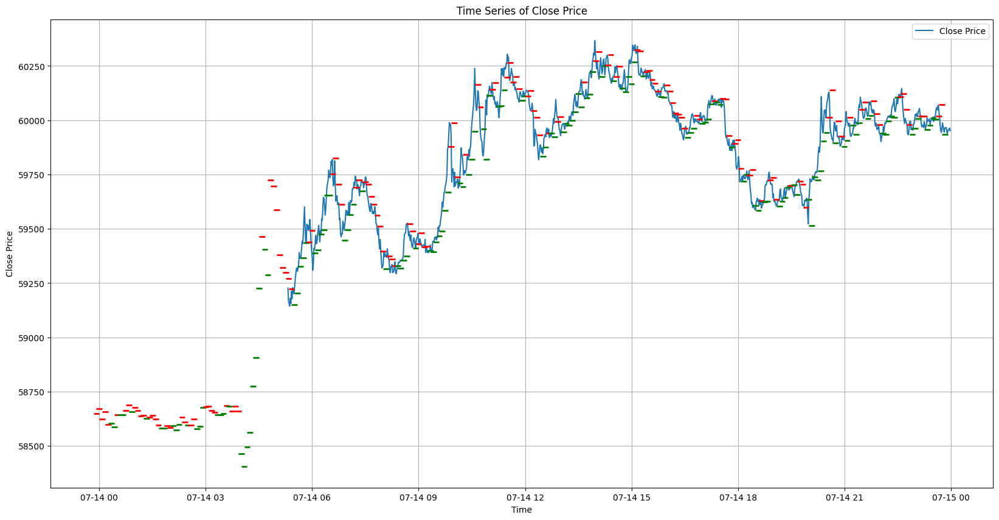

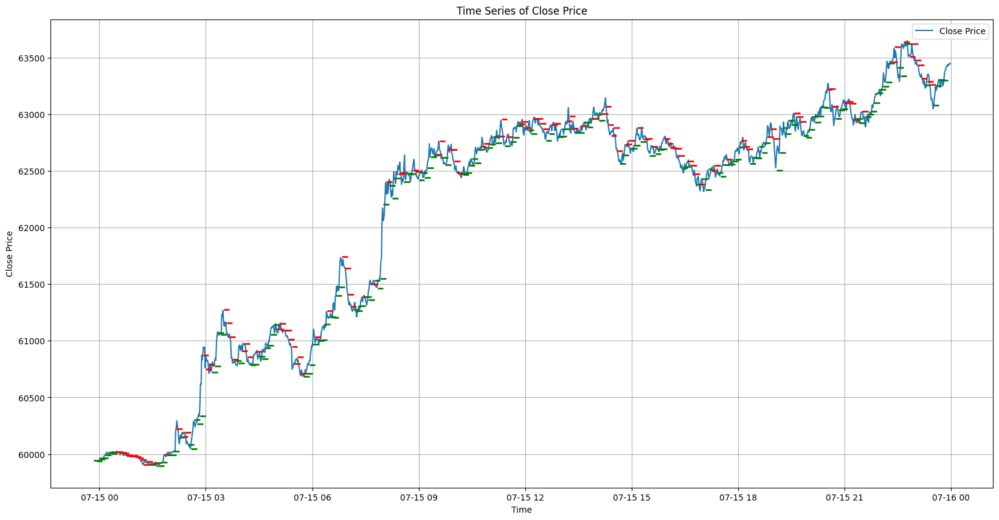

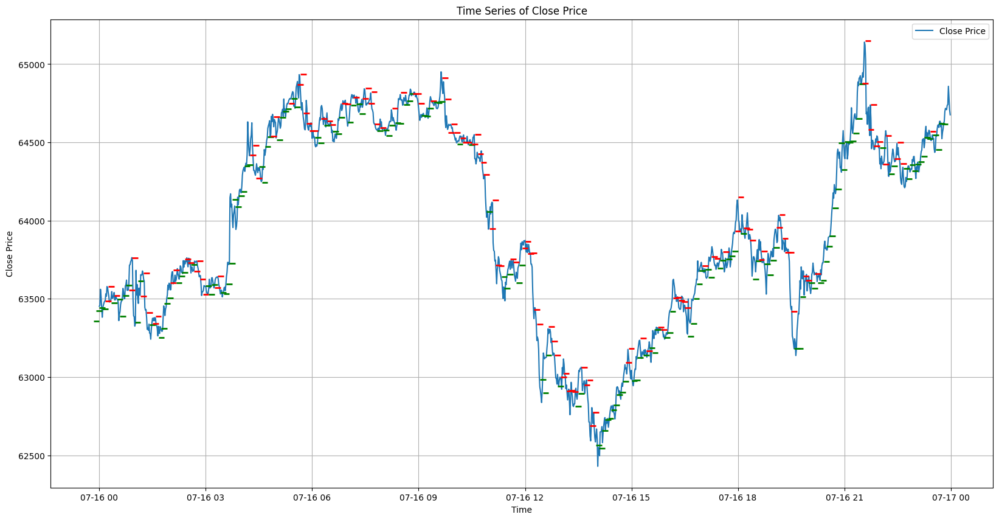

In [57]:

# Directory containing the CSV files
price_data_path = './csv_data/bitcoin_price_data.csv'
event_data_path = './bitcoin_data.csv'

dates = ['2024-07-14','2024-07-15', '2024-07-16']  # Input date
for date_str in dates:
    # Load data from CSV files
    price_data = load_price_data(date_str, price_data_path)
    event_data = load_event_data(date_str, event_data_path)


    # Plot the time series
    plot_time_series_with_intervals(price_data,event_data)
    # plot_time_series_with_intervals_hour(price_data,event_data)



In [81]:
# Directory containing the CSV files
price_data_path = './csv_data/bitcoin_price_data.csv'
event_data_path = './bitcoin_data.csv'

dates = ['2024-07-11', '2024-07-12','2024-07-13','2024-07-14','2024-07-15', '2024-07-16', '2024-07-17', '2024-07-18']  # Input date
counts = {}
for date_str in dates:
    # Load data from CSV files
    data = load_event_data(date_str, event_data_path)
    
    data['hour'] = data['end_time'].dt.hour
    
    # Create separate plots for each hour
    unique_hours = data['hour'].unique()

    for hour in unique_hours:
        hour_interval_data = data[data['start_time'].dt.hour == hour]
        settled =  hour_interval_data.groupby("settled_as").size().to_dict()
        if hour not in counts:
            counts[hour] = {}
        counts[hour][date_str] = settled
counts

{17: {'2024-07-11': {'No': 3, 'Yes': 9},
  '2024-07-12': {'No': 5, 'Yes': 7},
  '2024-07-13': {'No': 6, 'Yes': 6},
  '2024-07-14': {'No': 6, 'Yes': 6},
  '2024-07-15': {'No': 3, 'Yes': 9},
  '2024-07-16': {'No': 5, 'Yes': 7},
  '2024-07-17': {'No': 5, 'Yes': 7},
  '2024-07-18': {'No': 5, 'Yes': 7}},
 18: {'2024-07-11': {'No': 6, 'Yes': 6},
  '2024-07-12': {'No': 3, 'Yes': 9},
  '2024-07-13': {'No': 6, 'Yes': 6},
  '2024-07-14': {'No': 6, 'Yes': 6},
  '2024-07-15': {'No': 5, 'Yes': 7},
  '2024-07-16': {'No': 6, 'Yes': 6},
  '2024-07-17': {'No': 8, 'Yes': 4},
  '2024-07-18': {'No': 6, 'Yes': 6}},
 19: {'2024-07-11': {'No': 8, 'Yes': 4},
  '2024-07-12': {'No': 4, 'Yes': 8},
  '2024-07-13': {'No': 6, 'Yes': 6},
  '2024-07-14': {'No': 5, 'Yes': 7},
  '2024-07-15': {'No': 4, 'Yes': 8},
  '2024-07-16': {'No': 8, 'Yes': 4},
  '2024-07-17': {'No': 5, 'Yes': 7},
  '2024-07-18': {'No': 8, 'Yes': 4}},
 20: {'2024-07-11': {'No': 7, 'Yes': 5},
  '2024-07-12': {'No': 6, 'Yes': 6},
  '2024-07-13': {'N

# Training the model

In [66]:
import pandas as pd
import numpy as np
from ta import add_all_ta_features  # Using the 'technical analysis library' for additional features
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, precision_score
from sklearn.model_selection import GridSearchCV



In [78]:

# Load Bitcoin price data (assuming it has columns: time, open, high, low, close)
bitcoin_data = pd.read_csv('./csv_data/bitcoin_price_data.csv')

# Load event data (assuming it has columns: start_time, end_time, target_price, settled_as)
event_data = pd.read_csv('./bitcoin_data.csv')

# Feature engineering for Bitcoin price data
bitcoin_data['time'] = pd.to_datetime(bitcoin_data['time'], unit='s')
bitcoin_data = bitcoin_data.sort_values(by='time')
# Technical Analysis features (using TA-Lib or other libraries)
bitcoin_data = add_all_ta_features(bitcoin_data, open="open", high="high", low="low", close="close", volume='volumeto')
bitcoin_data.head(300)

,time,high,low,open,close,volumeto,volume_adi,volume_obv,volume_cmf,volume_fi,volume_em,volume_sma_em,volume_vpt,volume_vwap,volume_mfi,volume_nvi,volatility_bbm,volatility_bbh,volatility_bbl,volatility_bbw,volatility_bbp,volatility_bbhi,volatility_bbli,volatility_kcc,volatility_kch,volatility_kcl,volatility_kcw,volatility_kcp,volatility_kchi,volatility_kcli,volatility_dcl,volatility_dch,volatility_dcm,volatility_dcw,volatility_dcp,volatility_atr,volatility_ui,trend_macd,trend_macd_signal,trend_macd_diff,trend_sma_fast,trend_sma_slow,trend_ema_fast,trend_ema_slow,trend_vortex_ind_pos,trend_vortex_ind_neg,trend_vortex_ind_diff,trend_trix,trend_mass_index,trend_dpo,trend_kst,trend_kst_sig,trend_kst_diff,trend_ichimoku_conv,trend_ichimoku_base,trend_ichimoku_a,trend_ichimoku_b,trend_stc,trend_adx,trend_adx_pos,trend_adx_neg,trend_cci,trend_visual_ichimoku_a,trend_visual_ichimoku_b,trend_aroon_up,trend_aroon_down,trend_aroon_ind,trend_psar_up,trend_psar_down,trend_psar_up_indicator,trend_psar_down_indicator,momentum_rsi,momentum_stoch_rsi,momentum_stoch_rsi_k,momentum_stoch_rsi_d,momentum_tsi,momentum_uo,momentum_stoch,momentum_stoch_signal,momentum_wr,momentum_ao,momentum_roc,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,momentum_pvo,momentum_pvo_signal,momentum_pvo_hist,momentum_kama,others_dr,others_dlr,others_cr
0,2024-07-13 23:49:00,59239.92,59184.96,59194.61,59227.14,1550048.46,8.291744e+05,1.550048e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1000.000000,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,59272.300000,59162.380000,NaN,0.589156,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59212.440,NaN,0.000000,0.000000,0.000000,NaN,62160.249085,62125.47974,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
1,2024-07-13 23:50:00,59229.46,59154.63,59227.14,59165.77,2714874.20,-1.077369e+06,-1.164826e+06,NaN,NaN,-56214.680223,NaN,-2813.099360,NaN,NaN,1000.000000,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,59265.208333,59135.418333,NaN,0.233852,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59197.275,NaN,0.000000,0.000000,0.000000,NaN,62160.249085,62125.47974,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.103618,-0.103672,-0.103618
2,2024-07-13 23:51:00,59173.91,59148.64,59165.77,59156.45,2656273.33,-2.091735e+06,-3.821099e+06,NaN,NaN,-29272.510898,NaN,-3231.524870,NaN,NaN,999.842476,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,59238.451111,59135.077778,NaN,0.206748,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59194.280,NaN,0.000000,0.000000,0.000000,NaN,62160.249085,62125.47974,NaN,NaN,NaN,NaN,59239.920000,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.015752,-0.015754,-0.119354
3,2024-07-13 23:52:00,59159.12,59139.69,59156.45,59143.88,1785272.99,-3.107035e+06,-5.606372e+06,NaN,NaN,-12918.702142,NaN,-3610.872878,NaN,NaN,999.630023,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,59220.586667,59133.341667,NaN,0.120790,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59189.805,NaN,0.000000,0.000000,0.000000,NaN,62160.249085,62125.47974,NaN,NaN,NaN,NaN,59238.094400,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.021249,-0.021251,-0.140577
4,2024-07-13 23:53:00,59206.90,59140.37,59143.88,59179.72,2210723.21,-2.702638e+06,-3.395649e+06,NaN,NaN,72918.305318,NaN,-2271.219141,NaN,NaN,999.630023,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,59224.908000,59128.500000,NaN,0.531284,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59189.805,NaN,0.000000,0.000000,0.000000,NaN,62160.249085,62125.47974,NaN,NaN,NaN,NaN,59234.158224,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [79]:

# Function to extract temporal aggregates up to each event start time
def extract_temporal_features(event_start_time, bitcoin_data):
    # Filter Bitcoin data up to event start time
    filtered_data = bitcoin_data[bitcoin_data['time'] <= event_start_time]
    
    if filtered_data.empty:
        return None
    
    # Calculate aggregates
    temporal_features = {
        'mean_price': filtered_data['close'].mean(),
        'max_price': filtered_data['high'].max(),
        'min_price': filtered_data['low'].min(),
        'std_price': filtered_data['close'].std(),
        'price_change_1h': filtered_data['close'].iloc[-1] - filtered_data['close'].iloc[-60],  # Price change over last hour
        'price_change_5m': filtered_data['close'].iloc[-1] - filtered_data['close'].iloc[-5],  # Price change over last 5 minute
        'price_change_1d': filtered_data['close'].iloc[-1] - filtered_data['close'].iloc[0],    # Price change over last day
        # 'rsi': filtered_data['momentum_rsi'],  # Relative Strength Index
        # 'macd': filtered_data['trend_macd_diff'],  # MACD
        # Add more aggregates and technical indicators as needed
    }
    
    return temporal_features

# Apply feature extraction to event data
event_features = []
for idx, event in event_data.iterrows():
    features = extract_temporal_features(pd.to_datetime(event['start_time']), bitcoin_data)
    if features:
        features['target_price_deviation'] = bitcoin_data['close'].iloc[-1] - event['target_price']
        features['settled_as_binary'] = 1 if event['settled_as'] == 'Yes' else 0
        event_features.append(features)

# Create dataframe from extracted features
event_features_df = pd.DataFrame(event_features)
event_features_df.head()

TypeError: Invalid comparison between dtype=datetime64[ns] and Timestamp

In [ ]:

# Select relevant features and target variable
X = event_features_df.drop(['settled_as_binary'], axis=1)  # Features excluding target variable
y = event_features_df['settled_as_binary']  # Binary indicator for settled as Yes (1) or No (0)

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [ ]:

# Initialize Gradient Boosting Classifier


gb_clf = GradientBoostingClassifier(random_state=42)

# Define parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=gb_clf, param_grid=param_grid, 
                           scoring='precision', cv=5, n_jobs=-1)

# Train the model
grid_search.fit(X_train, y_train)

# Best parameters found by GridSearchCV
print("Best Parameters:", grid_search.best_params_)


In [ ]:

# Predictions on test set
y_pred = grid_search.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred))

# Example of using precision as the metric
precision = precision_score(y_test, y_pred)
print(f'Precision: {precision}')

In [4]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, precision_score


def load_price_data(csv_file_path):

    df = pd.read_csv(csv_file_path)
    df['time'] = pd.to_datetime(df['time'], unit='s', utc=True)
    df['time'] = df['time'].dt.tz_convert('Asia/Kolkata')  # Convert to IST


    return df

def load_event_data( csv_file_path):

    df = pd.read_csv(csv_file_path)
    df['start_time'] = pd.to_datetime(df['start_time'])
    df['end_time'] = pd.to_datetime(df['end_time'])


    return df

# Load Bitcoin price data (assuming it has columns: time, open, high, low, close)
bitcoin_data = load_price_data('./csv_data/bitcoin_price_data.csv')

# Load event data (assuming it has columns: start_time, end_time, target_price, settled_as)
event_data = load_event_data('./bitcoin_data.csv')

bitcoin_data = bitcoin_data.sort_values(by='time')
bitcoin_data.set_index('time', inplace=True)
print(bitcoin_data.head())

event_data = event_data.sort_values(by='start_time')
print(event_data.head())

                               high       low      open     close    volumeto
time                                                                         
2024-07-12 20:00:00+05:30  58015.26  57926.28  57937.83  57934.73  7435080.34
2024-07-12 20:01:00+05:30  57935.06  57885.62  57934.73  57890.04  3433980.04
2024-07-12 20:02:00+05:30  57913.98  57878.32  57890.04  57878.60  3572719.07
2024-07-12 20:03:00+05:30  57907.32  57877.76  57878.60  57878.26  2747225.51
2024-07-12 20:04:00+05:30  57904.98  57862.82  57878.26  57862.82  3139574.20
                    start_time                  end_time  target_price  \
1168 2024-07-11 08:05:00+05:30 2024-07-11 08:20:00+05:30      57966.30   
1169 2024-07-11 08:10:00+05:30 2024-07-11 08:25:00+05:30      57840.53   
1170 2024-07-11 08:15:00+05:30 2024-07-11 08:30:00+05:30      57840.01   
1171 2024-07-11 08:20:00+05:30 2024-07-11 08:35:00+05:30      57848.01   
1172 2024-07-11 08:25:00+05:30 2024-07-11 08:40:00+05:30      57895.60   

     sett

In [255]:
date_eval = "2024-07-20"
input_date = pd.to_datetime(date_eval)
eval_data = event_data[event_data['end_time'].dt.date == input_date.date()]
event_data = event_data[event_data['end_time'].dt.date < input_date.date()]
print("Eval shape :", eval_data.shape)
print("Train shape :", event_data.shape)


Eval shape : (288, 4)
Train shape : (2493, 4)


In [312]:

# Function to extract features from the last 5 events
def extract_features_from_last_events(current_event_start_time, current_event, event_data, bitcoin_data):
    # Filter events up to the current event start time
    past_events = event_data[(event_data['start_time']) < current_event_start_time]

    
    if len(past_events) < 4:
        return None  # Not enough past events to extract features
    
    # Get the last 5 events
    last_5_events = past_events.tail(4)
    last_5_events = last_5_events.head(3)
    # print(last_5_events)
    # print(current_event)
    
    # Extract features
    features = {}
    for i, (idx, event) in enumerate(last_5_events.iterrows()):
        event_start_time = (event['start_time'])
        event_end_time = (event['end_time'])
        # Binary outcome of the event
        features[f'event_{i+1}_outcome'] = 1 if event['settled_as'] == 'Yes' else 0
        # Target price of the event
        features[f'event_{i+1}_price_deviation'] = (bitcoin_data.loc[event_start_time, 'open'] - event['target_price']) if event_start_time in bitcoin_data.index else None
        # Closing price of Bitcoin at the start of the event
        # features[f'event_{i+1}_closing_price'] = bitcoin_data.loc[event_start_time, 'close'] if event_start_time in bitcoin_data.index else None
        
    past_events = bitcoin_data[last_5_events.iat[-1,0] : current_event_start_time]
    # print(past_events)
    if len(past_events) < 4:
        return None  # Not enough past events to extract features
    
    last_5_events = past_events.tail(4)
    # print(last_5_events)
    # print(current_event)

    for i, (idx, event) in enumerate(last_5_events.iterrows()):
        # print(event)
        features[f'target_{i+1}_price_deviation'] = (event['close'] - current_event["target_price"])
        features[f'high_{i+1}_price_deviation'] = (event['high'] - current_event["target_price"])
        features[f'low_{i+1}_price_deviation'] = (event['low'] - current_event["target_price"])

    
    # # features['target_price_deviation'] = (bitcoin_data.loc[current_event_start_time,'open'] - current_event['target_price']) if current_event_start_time in bitcoin_data.index else None
    # # features['minute'] = current_event_start_time.minute
    # # features['hour_of_day'] = current_event_start_time.hour
    # # features['day_of_week'] = current_event_start_time.dayofweek

    return features


In [257]:

# Apply feature extraction to event data
event_features = []
for idx, event in event_data.iterrows():
    event_start_time = (event['start_time'])
    features = extract_features_from_last_events(event_start_time, event, event_data, bitcoin_data)
    if features:
        features['settled_as_binary'] = 1 if event['settled_as'] == 'Yes' else 0
        event_features.append(features)
print(len(event_features))
# Create dataframe from extracted features
event_features_df = pd.DataFrame(event_features).dropna()  # Drop rows with NaN values
# event_features_df = event_features_df[event_features_df['target_price_deviation'] > 0]



2061


In [258]:
eval_data_feat = []
for idx, event in eval_data.iterrows():
    event_start_time = (event['start_time'])
    features = extract_features_from_last_events(event_start_time, event, eval_data, bitcoin_data)
    if features:
        features['settled_as_binary'] = 1 if event['settled_as'] == 'Yes' else 0
        eval_data_feat.append(features)
print(len(eval_data_feat))
# Create dataframe from extracted features
eval_feat_df = pd.DataFrame(eval_data_feat).dropna()

284


In [259]:
event_data.head()

,start_time,end_time,target_price,settled_as
1168,2024-07-11 08:05:00+05:30,2024-07-11 08:20:00+05:30,57966.30,No
1169,2024-07-11 08:10:00+05:30,2024-07-11 08:25:00+05:30,57840.53,Yes
1170,2024-07-11 08:15:00+05:30,2024-07-11 08:30:00+05:30,57840.01,Yes
1171,2024-07-11 08:20:00+05:30,2024-07-11 08:35:00+05:30,57848.01,Yes
1172,2024-07-11 08:25:00+05:30,2024-07-11 08:40:00+05:30,57895.60,No


In [260]:
event_features_df.head(20)

,event_1_outcome,event_1_price_deviation,event_2_outcome,event_2_price_deviation,event_3_outcome,event_3_price_deviation,target_1_price_deviation,high_1_price_deviation,low_1_price_deviation,target_2_price_deviation,high_2_price_deviation,low_2_price_deviation,target_3_price_deviation,high_3_price_deviation,low_3_price_deviation,target_4_price_deviation,high_4_price_deviation,low_4_price_deviation,settled_as_binary
3,0,0.08,1,2.81,0,-0.12,-23.85,40.33,-23.85,-24.83,7.70,-39.46,-0.56,0.61,-24.83,-32.03,8.67,-47.03,0
4,1,2.81,0,-0.12,0,-3.22,-6.37,20.68,-18.01,-12.23,-2.31,-15.40,0.75,0.75,-19.30,-51.53,12.63,-51.53,1
5,0,-0.12,0,-3.22,0,-0.56,1.94,6.98,-47.56,-22.75,2.81,-33.60,-1.63,-1.63,-29.88,-38.80,-1.00,-44.97,1
6,0,-3.22,0,-0.56,1,0.75,-11.17,-10.11,-100.90,48.66,52.73,-16.12,-13.21,51.13,-19.13,-69.67,-12.50,-105.61,1
7,0,-0.56,1,0.75,1,-1.63,26.49,29.58,-38.93,1.49,33.08,-7.19,-6.45,36.58,-16.68,45.22,53.56,-6.86,0
8,1,0.75,1,-1.63,1,-13.21,-9.60,22.54,-10.23,0.95,6.66,-23.64,-4.27,14.79,-4.27,17.14,29.88,-4.28,0
9,1,-1.63,1,-13.21,0,-6.45,57.36,89.03,23.20,19.61,62.79,16.67,0.73,27.92,-1.76,-6.35,19.54,-29.26,1
10,1,-13.21,0,-6.45,0,-4.27,-22.75,-22.75,-79.03,-61.22,-14.98,-61.22,-1.55,12.84,-66.90,55.58,56.70,-2.37,1
11,0,-6.45,0,-4.27,1,0.73,5.70,10.35,-191.30,-8.69,5.88,-33.48,-18.12,3.29,-46.93,-12.25,23.39,-35.11,0
12,0,-4.27,1,0.73,1,-1.55,104.09,158.83,80.88,88.08,125.75,85.92,13.92,98.29,13.80,-35.91,19.53,-47.40,1


In [261]:
event_features_df.shape

(2058, 19)

In [262]:

# Select relevant features and target variable
from sklearn.metrics import confusion_matrix
import xgboost as xgb

# event_features_df = event_features_df.sort_values(by="settled_as_binary")
X = event_features_df.drop(['settled_as_binary'], axis=1)  # Features excluding target variable
y = event_features_df['settled_as_binary']  # Binary indicator for settled as Yes (1) or No (0)

# Split data into training and test sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Gradient Boosting Classifier
gb_clf = GradientBoostingClassifier(random_state=42)

# Define parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [ 200, 250,350],
    'learning_rate': [0.005, 0.01, 0.1],
    'max_depth': [2, 3, 4]
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=gb_clf, param_grid=param_grid, 
                           scoring='accuracy', cv=5, n_jobs=-1)

# Train the model
grid_search.fit(X, y)

# Best parameters found by GridSearchCV
print("Best Parameters:", grid_search.best_params_)



Best Parameters: {'learning_rate': 0.01, 'max_depth': 2, 'n_estimators': 250}


In [263]:
X_eval = eval_feat_df.drop(['settled_as_binary'], axis=1)  # Features excluding target variable
y_eval = eval_feat_df['settled_as_binary']  # Binary indicator for settled as Yes (1) or No (0)
X_eval.shape, y_eval.shape

((284, 18), (284,))

In [264]:
import pickle
model_filename = 'grid_search_gradient_boosting_classifier.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(grid_search, file)

In [271]:
with open(model_filename, 'rb') as file:
    grid_search = pickle.load(file)

# Use the loaded model to make predictions

y_proba = grid_search.predict_proba(X_eval)

high_confidence_indices = (y_proba[:, 0] >= 0.6) | (y_proba[:, 1] >= 0.6)
filtered_y_test = y_eval[high_confidence_indices]
filtered_y_pred = (y_proba[high_confidence_indices, 1] >= 0.6).astype(int)

# Check if there are any filtered predictions to evaluate
if len(filtered_y_test) > 0:
    print(classification_report(filtered_y_test, filtered_y_pred))
    precision = precision_score(filtered_y_test, filtered_y_pred)
    print(f'Precision: {precision}')

    cm = confusion_matrix(filtered_y_test, filtered_y_pred)
    print("Confusion Matrix:")
    print(cm)
    profit = (cm[0][0] + cm[1][1])*4 - (cm[0][1] + cm[1][0])*5
    print("Total profit : ", profit)
else:
    print("No predictions with probability greater than 0.6 to evaluate.")

              precision    recall  f1-score   support

           0       0.86      0.40      0.55        30
           1       0.62      0.94      0.75        32

    accuracy                           0.68        62
   macro avg       0.74      0.67      0.65        62
weighted avg       0.74      0.68      0.65        62

Precision: 0.625
Confusion Matrix:
[[12 18]
 [ 2 30]]
Total profit :  68


In [5]:
from sklearn.ensemble import GradientBoostingClassifier

def train_classifier(X_train, y_train):
    gb_clf = GradientBoostingClassifier(random_state=42)

    # Define parameter grid for GridSearchCV
    param_grid = {
        'n_estimators': [ 200, 250,350],
        'learning_rate': [0.005, 0.01, 0.1],
        'max_depth': [2, 3, 4]
    }

    # Initialize GridSearchCV
    grid_search = GridSearchCV(estimator=gb_clf, param_grid=param_grid, 
                            scoring='accuracy', cv=5, n_jobs=-1)

    # Train the model
    grid_search.fit(X_train, y_train)

    return grid_search

In [6]:
from catboost import CatBoostClassifier

def train_catboost(X_train, y_train):
    catboost_model = CatBoostClassifier(verbose=0)
    
    param_grid = {
        'iterations': [100, 200],
        'learning_rate': [0.01, 0.1],
        'depth': [3, 5, 7]
    }
    
    grid_search = GridSearchCV(estimator=catboost_model, param_grid=param_grid, cv=3, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    
    return grid_search


In [7]:
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

def train_svm(X_train, y_train):
    svm_model = make_pipeline(StandardScaler(), SVC(probability=True))
    
    param_grid = {
        'svc__C': [0.1, 1, 10],
        'svc__gamma': [1, 0.1, 0.01],
        'svc__kernel': ['rbf']
    }
    
    grid_search = GridSearchCV(estimator=svm_model, param_grid=param_grid, cv=3, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    
    return grid_search


In [8]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_score, confusion_matrix

def train_random_forest(X_train, y_train):
    rf_model = RandomForestClassifier()
    
    param_grid = {
        'n_estimators': [100, 200],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10]
    }
    
    grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=3, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    
    # best_model = grid_search.best_estimator_
    return grid_search


In [22]:

# Function to extract features from the last 5 events
def extract_features_from_last_events(current_event_start_time, current_event, event_data, bitcoin_data):
    # Filter events up to the current event start time
    past_events = event_data[(event_data['start_time']) < current_event_start_time]

    
    if len(past_events) < 1:
        return None  # Not enough past events to extract features
    

    # Extract features
    features = {}
    # print("bitcoin_data",current_event_start_time , "past", past_events.iat[-1,1])
    past_events = bitcoin_data[past_events.iat[-1,0] : past_events.iat[-1,1] ]
    if len(past_events) < 6:
        return None  # Not enough past events to extract features
    
    last_5_events = past_events.tail(6)
    last_5_events = last_5_events.head(3)

    # print("last_5_events", last_5_events) 
    # print("current_event",current_event)

    for i, (idx, event) in enumerate(last_5_events.iterrows()):
        # print(event)
        features[f'target_{i+1}_price_deviation'] = (event['open'] - current_event["target_price"])
        # features[f'high_{i+1}_price_deviation'] = (event['high'] - current_event["target_price"])
        # features[f'low_{i+1}_price_deviation'] = (event['low'] - current_event["target_price"])

    return features


In [23]:
from sklearn.metrics import confusion_matrix
import xgboost as xgb
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, precision_score
import pickle


def get_model(date_eval):
    bitcoin_data = load_price_data('./csv_data/bitcoin_price_data.csv')
    bitcoin_data = bitcoin_data.sort_values(by='time')
    bitcoin_data.set_index('time', inplace=True)

    # Load event data (assuming it has columns: start_time, end_time, target_price, settled_as)
    event_data = load_event_data('./bitcoin_data.csv')
    event_data = event_data.sort_values(by='start_time')

    input_date = pd.to_datetime(date_eval)
    event_data = event_data[event_data['end_time'].dt.date <= input_date.date()]

    event_features = []
    for idx, event in event_data.iterrows():
        event_start_time = (event['start_time'])
        features = extract_features_from_last_events(event_start_time, event, event_data, bitcoin_data)
        if features:
            features['settled_as_binary'] = 1 if event['settled_as'] == 'Yes' else 0
            event_features.append(features)
    print(len(event_features))
    # Create dataframe from extracted features
    event_features_df = pd.DataFrame(event_features).dropna()

    # print(event_features_df.head())

    # event_features_df = event_features_df.sort_values(by="settled_as_binary")
    X = event_features_df.drop(['settled_as_binary'], axis=1)  # Features excluding target variable
    y = event_features_df['settled_as_binary']  # Binary indicator for settled as Yes (1) or No (0)

    # Initialize GridSearchCV
    grid_search = train_catboost(X,y)

    # Train the model
    grid_search.fit(X, y)

    # Best parameters found by GridSearchCV
    print("Best Parameters:", grid_search.best_params_)
    model_filename = 'grid_search_gradient_boosting_classifier1.pkl'
    with open(model_filename, 'wb') as file:
        pickle.dump(grid_search, file)


In [24]:
get_model('2024-07-27')

4366
Best Parameters: {'depth': 3, 'iterations': 200, 'learning_rate': 0.01}


In [33]:
def evaluate_model(date_eval):
    bitcoin_data = load_price_data('./csv_data/bitcoin_price_data.csv')

    # Load event data (assuming it has columns: start_time, end_time, target_price, settled_as)
    event_data = load_event_data('./bitcoin_data.csv')

    bitcoin_data = bitcoin_data.sort_values(by='time')
    bitcoin_data.set_index('time', inplace=True)

    event_data = event_data.sort_values(by='start_time')

    
    input_date = pd.to_datetime(date_eval)
    eval_data = event_data[event_data['end_time'].dt.date == input_date.date()]

    eval_data_feat = []
    for idx, event in eval_data.iterrows():
        event_start_time = (event['start_time'])
        features = extract_features_from_last_events(event_start_time, event, eval_data, bitcoin_data)
        if features:
            features["start_time"] = event_start_time
            features['settled_as_binary'] = 1 if event['settled_as'] == 'Yes' else 0
            eval_data_feat.append(features)
    print(len(eval_data_feat))
    # Create dataframe from extracted features
    eval_feat_df = pd.DataFrame(eval_data_feat).dropna()

    X_eval = eval_feat_df.drop(['settled_as_binary', 'start_time'], axis=1)  # Features excluding target variable
    y_eval = eval_feat_df['settled_as_binary'] 
    print(X_eval.shape)
    model_filename = 'grid_search_gradient_boosting_classifier1.pkl'

    with open(model_filename, 'rb') as file:
        loaded_model = pickle.load(file)

    # Use the loaded model to make predictions

    y_proba = loaded_model.predict_proba(X_eval)

    threshold = 0.55
    high_confidence_indices = (y_proba[:, 0] >= threshold) | (y_proba[:, 1] >= threshold)
    filtered_y_test = y_eval[high_confidence_indices]
    filtered_y_pred = (y_proba[high_confidence_indices, 1] >= threshold).astype(int)

    max_profit = 0
    max_loss = 0
    score = 0

    for i in range(len(eval_feat_df[high_confidence_indices])):
        # print(eval_feat_df[high_confidence_indices].iloc[i,4])
        if eval_feat_df[high_confidence_indices].iloc[i,4] == filtered_y_pred[i]:
            score = score + 4
        else :
            score = score - 5

        max_profit = max(max_profit, score)
        max_loss = min(max_loss, score)
    print(f"The final score for the date {eval_feat_df[high_confidence_indices].iloc[i,3]} is: {score}. Max Profit : {max_profit}, Max Loss : {max_loss}")

    # Check if there are any filtered predictions to evaluate
    if len(filtered_y_test) > 0:
        # print(classification_report(filtered_y_test, filtered_y_pred))
        # precision = precision_score(filtered_y_test, filtered_y_pred)
        # print(f'Precision: {precision}')

        cm = confusion_matrix(filtered_y_test, filtered_y_pred)
        print("Confusion Matrix:")
        print(cm)
        profit = (cm[0][0] + cm[1][1])*4 - (cm[0][1] + cm[1][0])*5
        print("Total profit : ", profit)
    else:
        print("No predictions with probability greater than 0.6 to evaluate.")

In [34]:
dates = [
    '2024-07-29','2024-07-30','2024-07-31','2024-08-01','2024-08-02',
    '2024-08-03'
    ,
    '2024-08-04'
    ,
    '2024-08-12'
    ,
    '2024-08-13'
    ,
    '2024-08-14'
    ,
    '2024-08-15'
    ,
    '2024-08-16'
    ,
    '2024-08-17'
    ,
    '2024-08-18'
    ,
    '2024-08-19'
    ]  # Input date
for date_str in dates:
    evaluate_model(date_str)

287
(287, 3)
The final score for the date 2024-07-29 23:45:00+05:30 is: 327. Max Profit : 332, Max Loss : -6
Confusion Matrix:
[[76 43]
 [26 92]]
Total profit :  327
287
(287, 3)
The final score for the date 2024-07-30 23:45:00+05:30 is: 286. Max Profit : 311, Max Loss : -22
Confusion Matrix:
[[78 44]
 [26 81]]
Total profit :  286
287
(287, 3)
The final score for the date 2024-07-31 23:40:00+05:30 is: 290. Max Profit : 301, Max Loss : -1
Confusion Matrix:
[[62 42]
 [24 93]]
Total profit :  290
287
(287, 3)
The final score for the date 2024-08-01 23:45:00+05:30 is: 113. Max Profit : 118, Max Loss : -25
Confusion Matrix:
[[77 58]
 [37 70]]
Total profit :  113
287
(287, 3)
The final score for the date 2024-08-02 23:45:00+05:30 is: 336. Max Profit : 336, Max Loss : -2
Confusion Matrix:
[[76 39]
 [29 93]]
Total profit :  336
287
(287, 3)
The final score for the date 2024-08-03 23:45:00+05:30 is: 130. Max Profit : 158, Max Loss : -19
Confusion Matrix:
[[74 54]
 [40 76]]
Total profit :  130
1

In [21]:
filtered_y_pred

NameError: name 'filtered_y_pred' is not defined

In [456]:
np.array(filtered_y_test)

array([1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0,
       1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1,
       0, 0, 1, 0])

# LSTM training

In [485]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, precision_score, confusion_matrix


In [486]:

def load_price_data(csv_file_path):

    df = pd.read_csv(csv_file_path)
    df['time'] = pd.to_datetime(df['time'], unit='s', utc=True)
    df['time'] = df['time'].dt.tz_convert('Asia/Kolkata')  # Convert to IST


    return df

def load_event_data( csv_file_path):

    df = pd.read_csv(csv_file_path)
    df['start_time'] = pd.to_datetime(df['start_time'])
    df['end_time'] = pd.to_datetime(df['end_time'])


    return df

# Load Bitcoin price data (assuming it has columns: time, open, high, low, close)
bitcoin_data = load_price_data('./csv_data/bitcoin_price_data.csv')

# Load event data (assuming it has columns: start_time, end_time, target_price, settled_as)
event_data = load_event_data('./bitcoin_data.csv')

bitcoin_data = bitcoin_data.sort_values(by='time')
bitcoin_data.set_index('time', inplace=True)
print(bitcoin_data.head())

event_data = event_data.sort_values(by='start_time')
print(event_data.head())

                               high       low      open     close    volumeto
time                                                                         
2024-07-12 20:00:00+05:30  58015.26  57926.28  57937.83  57934.73  7435080.34
2024-07-12 20:01:00+05:30  57935.06  57885.62  57934.73  57890.04  3433980.04
2024-07-12 20:02:00+05:30  57913.98  57878.32  57890.04  57878.60  3572719.07
2024-07-12 20:03:00+05:30  57907.32  57877.76  57878.60  57878.26  2747225.51
2024-07-12 20:04:00+05:30  57904.98  57862.82  57878.26  57862.82  3139574.20
                    start_time                  end_time  target_price  \
1168 2024-07-11 08:05:00+05:30 2024-07-11 08:20:00+05:30      57966.30   
1169 2024-07-11 08:10:00+05:30 2024-07-11 08:25:00+05:30      57840.53   
1170 2024-07-11 08:15:00+05:30 2024-07-11 08:30:00+05:30      57840.01   
1171 2024-07-11 08:20:00+05:30 2024-07-11 08:35:00+05:30      57848.01   
1172 2024-07-11 08:25:00+05:30 2024-07-11 08:40:00+05:30      57895.60   

     sett

In [487]:
date_eval = "2024-07-21"
input_date = pd.to_datetime(date_eval)
eval_data = event_data[event_data['end_time'].dt.date == input_date.date()]
event_data = event_data[event_data['end_time'].dt.date < input_date.date()]
print("Eval shape :", eval_data.shape)
print("Train shape :", event_data.shape)

Eval shape : (165, 4)
Train shape : (2781, 4)


In [507]:
def extract_features_for_event(event, bitcoin_data, lookback_minutes=1):
    event_start_time = event['start_time']
    lookback_start_time = event_start_time - pd.Timedelta(minutes=lookback_minutes)
    
    # Extract Bitcoin price data for the lookback period
    lookback_data = bitcoin_data[lookback_start_time:event_start_time]
    if lookback_data.empty or event_start_time not in bitcoin_data.index:
        return None


    # Aggregate features over the event duration
    features = {
        'open': lookback_data['open'].iloc[0],
        'close': lookback_data['close'].iloc[-1],
        'diff': event['target_price'] - bitcoin_data.loc[event_start_time,'open'],
    }

    return features

In [508]:
# Apply feature extraction to event data
event_features = []
for idx, event in event_data.iterrows():
    features = extract_features_for_event(event, bitcoin_data)
    if features:
        features['settled_as_binary'] = 1 if event['settled_as'] == 'Yes' else 0
        event_features.append(features)
print(len(event_features))
# Create dataframe from extracted features
event_features_df = pd.DataFrame(event_features).dropna()  # Drop rows with NaN values
event_features_df.shape

2350


(2350, 4)

In [509]:
eval_data_feat = []
for idx, event in eval_data.iterrows():
    features = extract_features_for_event(event, bitcoin_data)
    if features:
        features['settled_as_binary'] = 1 if event['settled_as'] == 'Yes' else 0
        eval_data_feat.append(features)
print(len(eval_data_feat))
# Create dataframe from extracted features
eval_feat_df = pd.DataFrame(eval_data_feat).dropna()
eval_feat_df.shape

141


(141, 4)

In [510]:
X = event_features_df.drop(['settled_as_binary'], axis=1)  # Features excluding target variable
y = event_features_df['settled_as_binary']  # Binary indicator for settled as Yes (1) or No (0)

X = np.array(X)
y = np.array(y)
X = X.reshape((X.shape[0], 1, X.shape[1]))

# Split data into training and test sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build LSTM model
model = Sequential()
model.add(LSTM(32, input_shape=(X.shape[1], X.shape[2])))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X, y, epochs=10, batch_size=16, validation_split=0.1, verbose=2)


Epoch 1/10
133/133 - 1s - loss: 0.7011 - accuracy: 0.5064 - val_loss: 0.6932 - val_accuracy: 0.5064 - 980ms/epoch - 7ms/step
Epoch 2/10
133/133 - 0s - loss: 0.6969 - accuracy: 0.5234 - val_loss: 0.6960 - val_accuracy: 0.5064 - 106ms/epoch - 794us/step
Epoch 3/10
133/133 - 0s - loss: 0.6940 - accuracy: 0.4965 - val_loss: 0.6931 - val_accuracy: 0.5064 - 104ms/epoch - 780us/step
Epoch 4/10
133/133 - 0s - loss: 0.6924 - accuracy: 0.5234 - val_loss: 0.6934 - val_accuracy: 0.5064 - 102ms/epoch - 769us/step
Epoch 5/10
133/133 - 0s - loss: 0.6926 - accuracy: 0.5234 - val_loss: 0.6934 - val_accuracy: 0.5064 - 102ms/epoch - 769us/step
Epoch 6/10
133/133 - 0s - loss: 0.6923 - accuracy: 0.5234 - val_loss: 0.6934 - val_accuracy: 0.5064 - 103ms/epoch - 775us/step
Epoch 7/10
133/133 - 0s - loss: 0.6924 - accuracy: 0.5234 - val_loss: 0.6942 - val_accuracy: 0.5064 - 105ms/epoch - 791us/step
Epoch 8/10
133/133 - 0s - loss: 0.6924 - accuracy: 0.5234 - val_loss: 0.6938 - val_accuracy: 0.5064 - 105ms/epoch

In [511]:
X_eval = eval_feat_df.drop(['settled_as_binary'], axis=1)  # Features excluding target variable
y_eval = eval_feat_df['settled_as_binary']  # Binary indicator for settled as Yes (1) or No (0)

X_eval = np.array(X_eval)
y_eval = np.array(y_eval)
X_eval = X_eval.reshape((X_eval.shape[0], 1, X_eval.shape[1]))

In [512]:
y_proba = model.predict(X_eval)

# Consider only predictions with probability > 0.6 for either class
high_confidence_indices = (y_proba[:, 0] > 0.55) | (y_proba[:, 0] < 0.55)
filtered_y_test = y_eval[high_confidence_indices]
filtered_y_pred = (y_proba[high_confidence_indices, 0] > 0.55).astype(int)

# Check if there are any filtered predictions to evaluate
if len(filtered_y_test) > 0:
    print(classification_report(filtered_y_test, filtered_y_pred))
    precision = precision_score(filtered_y_test, filtered_y_pred)
    print(f'Precision: {precision}')

    cm = confusion_matrix(filtered_y_test, filtered_y_pred)
    print("Confusion Matrix:")
    print(cm)
    profit = (cm[0][0] + cm[1][1])*4 - (cm[0][1] + cm[1][0])*5
    print("Total profit : ", profit)
else:
    print("No predictions with probability greater than 0.6 to evaluate.")

5/5 [==============================] - 0s 682us/step
              precision    recall  f1-score   support

           0       0.52      1.00      0.68        73
           1       0.00      0.00      0.00        68

    accuracy                           0.52       141
   macro avg       0.26      0.50      0.34       141
weighted avg       0.27      0.52      0.35       141

Precision: 0.0
Confusion Matrix:
[[73  0]
 [68  0]]
Total profit :  -48


/Users/pratham28/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/pratham28/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/pratham28/Library/Python/3.9/lib/python/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/

In [18]:
import pandas as pd
import pytz
import pandas as pd
import matplotlib.pyplot as plt
import pytz
import math

def read_parquet_file(filename):
    """
    Reads the Parquet file and ensures the time column is in IST.
    """
    # Read the Parquet file
    df = pd.read_parquet(filename)
    
    # Convert the time column to IST if it's not already in IST
    if df['time'].dt.tz != pytz.timezone('Asia/Kolkata'):
        df['time'] = df['time'].dt.tz_convert('Asia/Kolkata')
    
    return df

# Example usage
filename = 'bitcoin_events_price.parquet'
df = read_parquet_file(filename)
print(df.head())


                       time  avgYesPrice  avgNoPrice indx  event_id
0 2024-07-25 02:05:10+05:30     4.000000    6.000000    0   2809523
1 2024-07-25 02:05:30+05:30     5.500000    4.500000    2   2809523
2 2024-07-25 02:05:50+05:30     6.100000    3.900000    4   2809523
3 2024-07-25 02:06:10+05:30     5.785714    4.214286    6   2809523
4 2024-07-25 02:06:30+05:30     5.222222    4.777778    8   2809523


In [19]:
df["event_id"].value_counts()

2812166    30
2823621    30
2813871    30
2815282    30
2817347    30
           ..
2814592    23
2812559    22
2812656    22
2817850    22
2812692    21
Name: event_id, Length: 1049, dtype: int64

In [20]:
df_sample = df[:1000]
df

,time,avgYesPrice,avgNoPrice,indx,event_id
0,2024-07-25 02:05:10+05:30,4.000000,6.000000,0,2809523
1,2024-07-25 02:05:30+05:30,5.500000,4.500000,2,2809523
2,2024-07-25 02:05:50+05:30,6.100000,3.900000,4,2809523
3,2024-07-25 02:06:10+05:30,5.785714,4.214286,6,2809523
4,2024-07-25 02:06:30+05:30,5.222222,4.777778,8,2809523
...,...,...,...,...,...
30005,2024-07-28 17:33:20+05:30,0.500000,9.500000,49,2824591
30006,2024-07-28 17:33:40+05:30,0.500000,9.500000,51,2824591
30007,2024-07-28 17:34:00+05:30,0.500000,9.500000,53,2824591
30008,2024-07-28 17:34:20+05:30,0.500000,9.500000,55,2824591


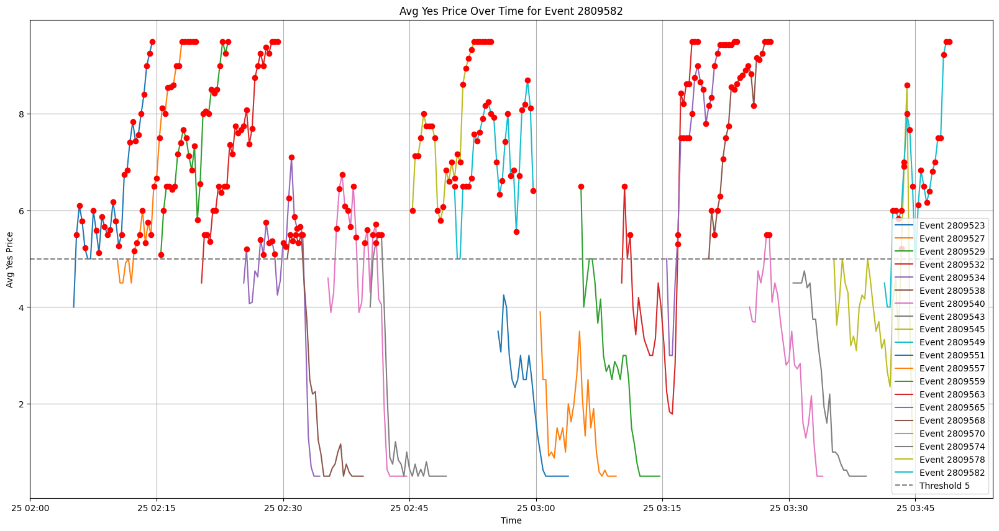

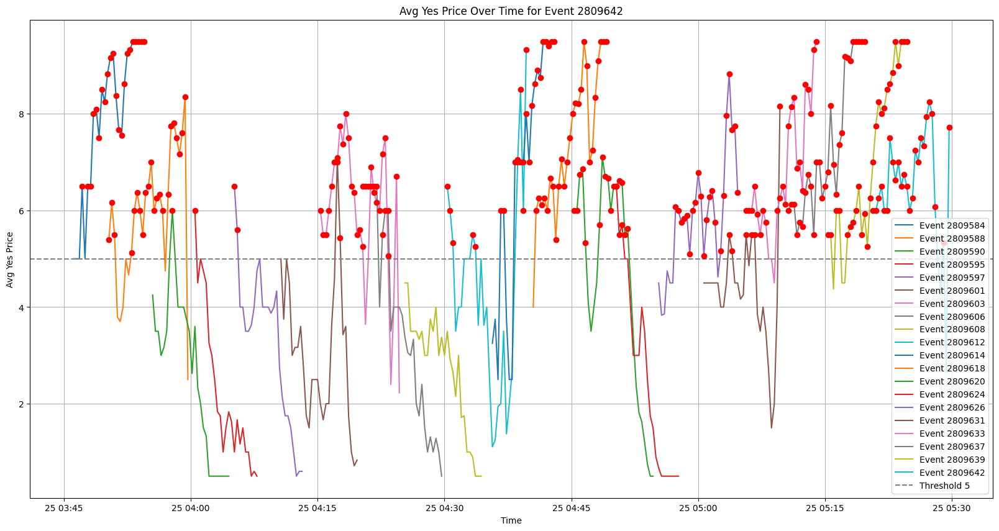

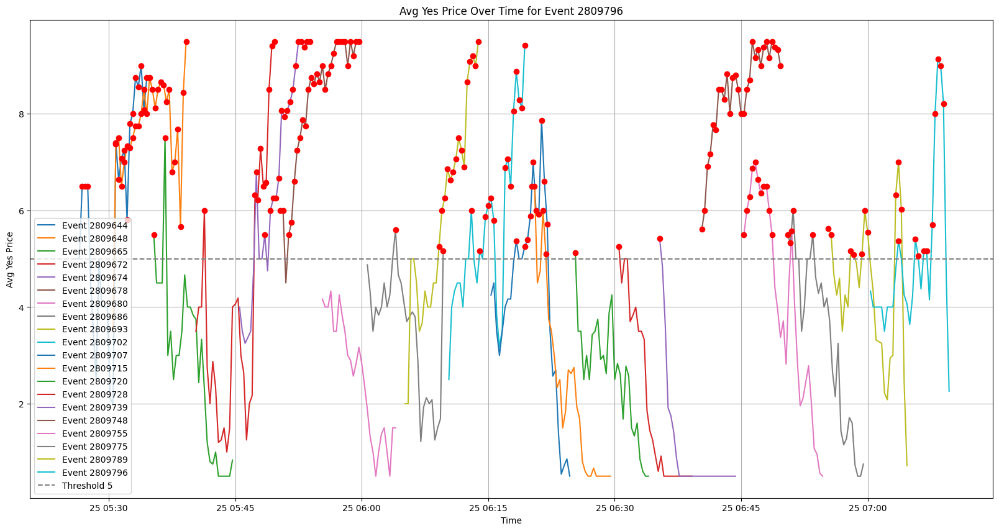

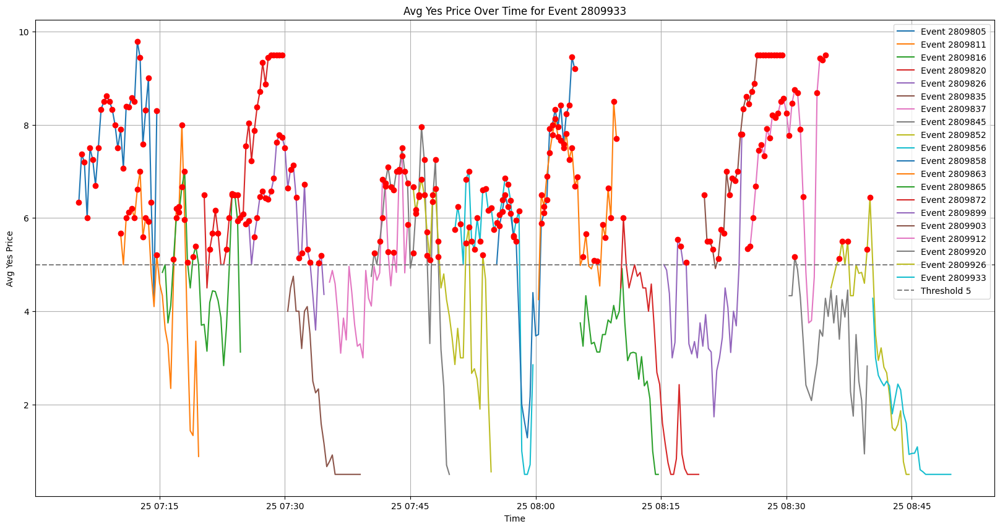

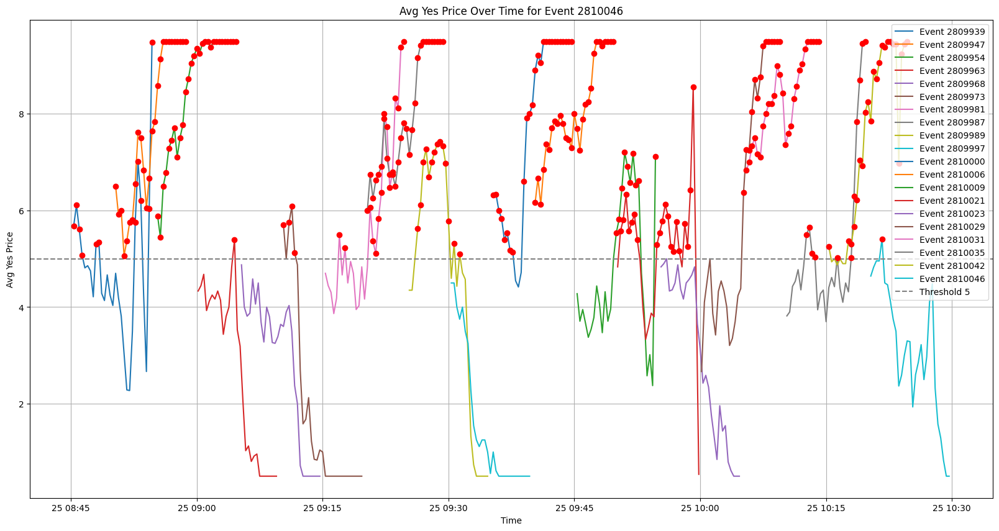

...

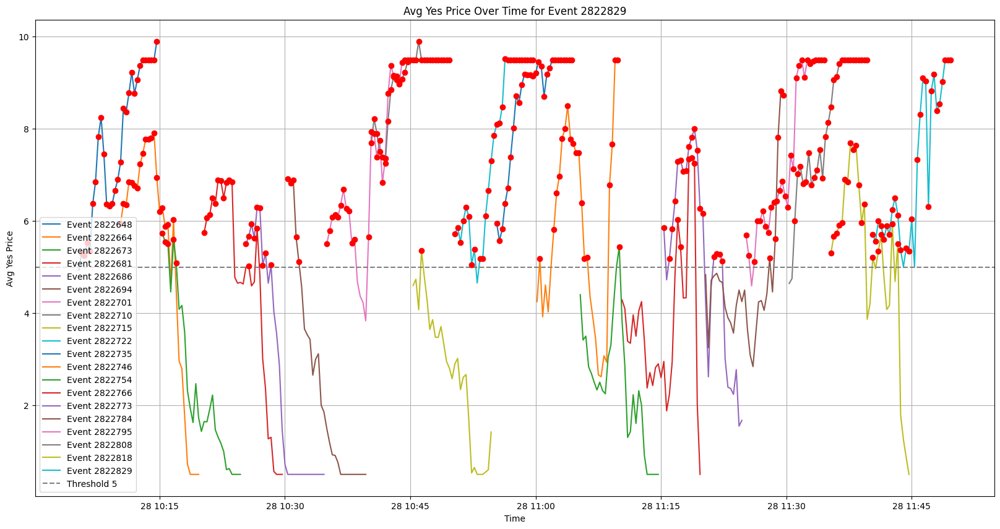

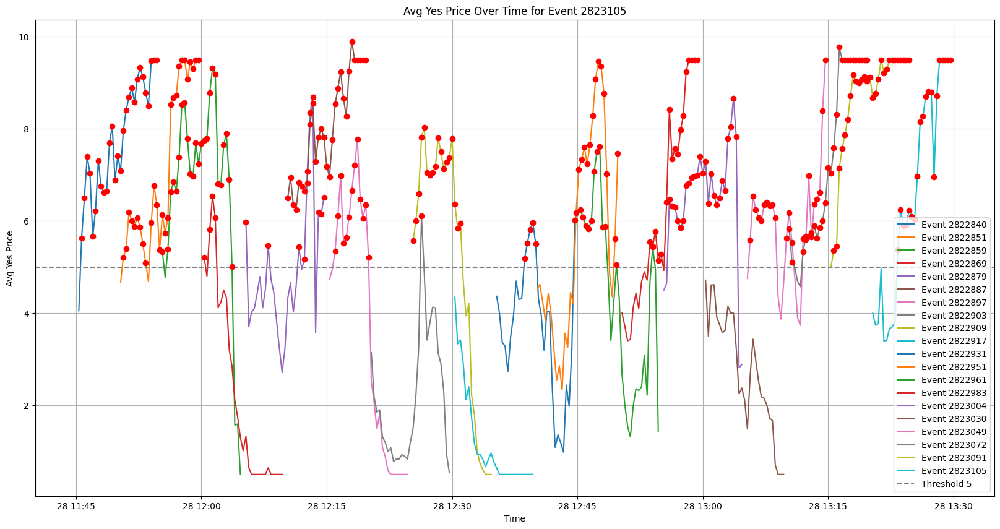

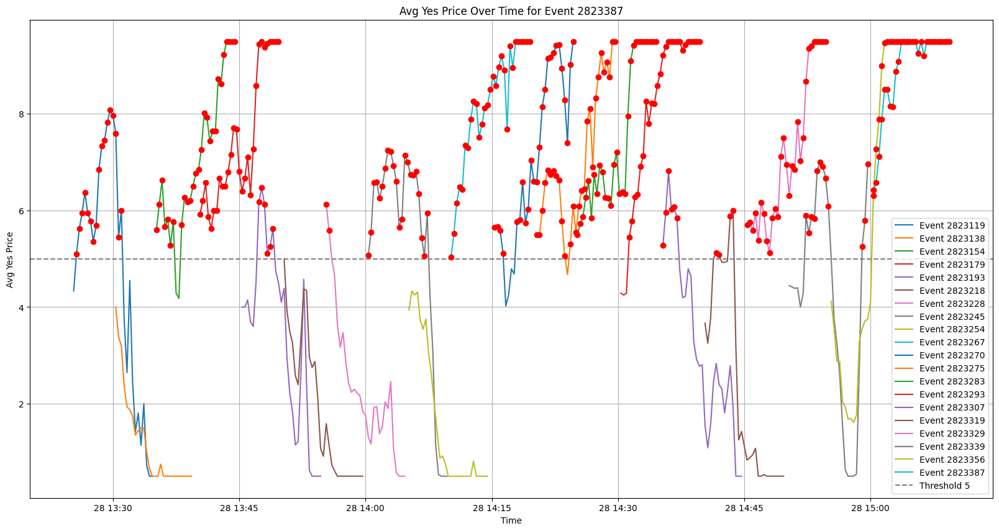

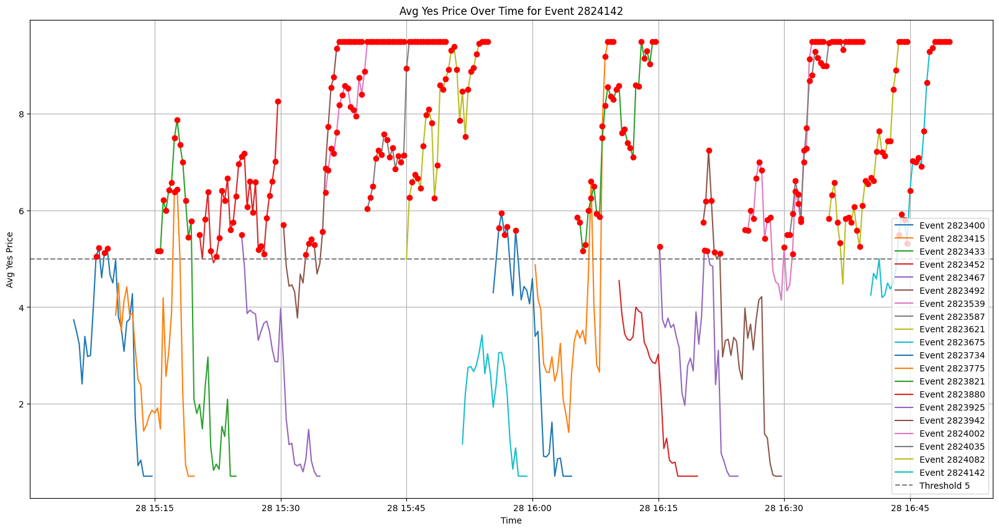

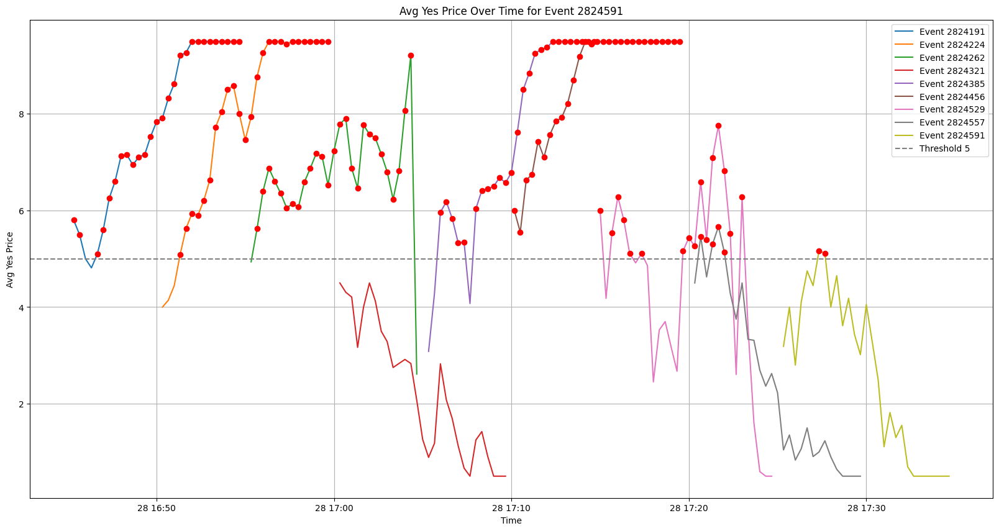

In [21]:
threshold = 5
batch_size = 20
grouped = df.groupby('event_id')
event_ids = list(grouped.groups.keys())

num_batches = math.ceil(len(event_ids) / batch_size)

for batch in range(num_batches):
    plt.figure(figsize=(20, 10))
    
    start_idx = batch * batch_size
    end_idx = min((batch + 1) * batch_size, len(event_ids))
    batch_event_ids = event_ids[start_idx:end_idx]
    
    for event_id in batch_event_ids:
        group = grouped.get_group(event_id)
        # Extract time and avgYesPrice for the current event
        time = group['time']
        avg_yes_price = group['avgYesPrice']
        
        # Plot the avgYesPrice over time for the current event
        plt.plot(time, avg_yes_price, label=f'Event {event_id}')
        
        # Highlight points above the threshold
        above_threshold = avg_yes_price > threshold
        plt.scatter(time[above_threshold], avg_yes_price[above_threshold], color='red', zorder=5)
    
    # Plot the threshold line
    plt.axhline(y=threshold, color='grey', linestyle='--', label=f'Threshold {threshold}')
    
    # Adding labels and title
    plt.xlabel('Time')
    plt.ylabel('Avg Yes Price')
    plt.title(f'Avg Yes Price Over Time for Event {event_id}')
    plt.legend()
    plt.grid(True)
    plt.show()